In [2]:
## written by keshavardhan reddy

import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
from tqdm import tqdm
import math


In [3]:
class DIV2KDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, crop_size=96):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir
        self.crop_size = crop_size
        self.hr_images = sorted(os.listdir(hr_dir))
        self.lr_images = sorted(os.listdir(lr_dir))

    def __len__(self):
        return len(self.hr_images)

    def __getitem__(self, idx):
        hr_path = os.path.join(self.hr_dir, self.hr_images[idx])
        lr_path = os.path.join(self.lr_dir, self.lr_images[idx])

        hr = Image.open(hr_path).convert("RGB")
        lr = Image.open(lr_path).convert("RGB")

        # Center crop for training
        hr = transforms.CenterCrop(self.crop_size)(hr)
        lr = transforms.CenterCrop(self.crop_size // 2)(lr)

        hr = transforms.ToTensor()(hr)
        lr = transforms.ToTensor()(lr)
        return lr, hr


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class PatchEmbed(nn.Module):
    def __init__(self, in_channels=3, embed_dim=96, patch_size=1):
        super().__init__()
        self.proj = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        return self.proj(x)

def window_partition(x, window_size):
    B, C, H, W = x.shape
    x = x.view(B, C, H // window_size, window_size, W // window_size, window_size)
    windows = x.permute(0, 2, 4, 3, 5, 1).contiguous().view(-1, window_size, window_size, C)
    return windows

def window_reverse(windows, window_size, H, W):
    B = int(windows.shape[0] / (H * W / window_size / window_size))
    x = windows.view(B, H // window_size, W // window_size, window_size, window_size, -1)
    x = x.permute(0, 5, 1, 3, 2, 4).contiguous().view(B, -1, H, W)
    return x


class WindowAttention(nn.Module):
    def __init__(self, dim, num_heads, window_size):
        super().__init__()
        self.dim = dim
        self.heads = num_heads
        self.window_size = window_size
        self.scale = (dim // num_heads) ** -0.5

        self.qkv = nn.Linear(dim, dim * 3, bias=True)
        self.proj = nn.Linear(dim, dim)

    def forward(self, x):
        B_, N, C = x.shape  # B_ = batch*num_windows
        qkv = self.qkv(x).reshape(B_, N, 3, self.heads, C // self.heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = F.softmax(attn, dim=-1)

        out = (attn @ v).transpose(1, 2).reshape(B_, N, C)
        return self.proj(out)

class SwinTransformerBlock(nn.Module):
    def __init__(self, dim, input_resolution, num_heads, window_size=8, mlp_ratio=4.0):
        super().__init__()
        self.dim = dim
        self.input_resolution = input_resolution
        self.window_size = window_size

        self.norm1 = nn.LayerNorm(dim)
        self.attn = WindowAttention(dim, num_heads, window_size)

        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, int(dim * mlp_ratio)),
            nn.GELU(),
            nn.Linear(int(dim * mlp_ratio), dim)
        )

    def forward(self, x):
        B, C, H, W = x.shape
        shortcut = x

        x = x.permute(0, 2, 3, 1)  # B H W C
        x = x.view(B, H * W, C)
        x = self.norm1(x)
        x = x.view(B, H, W, C).permute(0, 3, 1, 2)

        x_windows = window_partition(x, self.window_size)  # [num_windows*B, Ws, Ws, C]
        x_windows = x_windows.view(-1, self.window_size * self.window_size, C)
        attn_windows = self.attn(x_windows)
        x = window_reverse(attn_windows, self.window_size, H, W)

        x = x + shortcut

        x = x.permute(0, 2, 3, 1).view(B, H * W, C)
        x = self.norm2(x)
        x = self.mlp(x)
        x = x.view(B, H, W, C).permute(0, 3, 1, 2)

        return x

class RSTB(nn.Module):
    def __init__(self, dim, depth, num_heads, window_size):
        super().__init__()
        self.blocks = nn.Sequential(*[
            SwinTransformerBlock(dim, (None, None), num_heads, window_size)
            for _ in range(depth)
        ])
        self.conv = nn.Conv2d(dim, dim, kernel_size=3, padding=1)

    def forward(self, x):
        out = self.blocks(x)
        out = self.conv(out)
        return out + x

class SwinIR(nn.Module):
    def __init__(self, embed_dim=96, depths=[6], num_heads=[6], window_size=8, scale=2):
        super().__init__()
        self.shallow = PatchEmbed(in_channels=3, embed_dim=embed_dim)

        self.body = nn.Sequential(*[
            RSTB(embed_dim, depth, num_heads[i], window_size)
            for i, depth in enumerate(depths)
        ])

        self.upsample = nn.Sequential(
            nn.Conv2d(embed_dim, embed_dim * 4, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.Conv2d(embed_dim, 3, 3, 1, 1)
        )

    def forward(self, x):
        x = self.shallow(x)
        x = self.body(x)
        x = self.upsample(x)
        return x


In [5]:
def calc_psnr(sr, hr):
    mse = nn.functional.mse_loss(sr, hr)
    if mse == 0:
        return 100
    return 20 * torch.log10(1.0 / torch.sqrt(mse))

def train(model, train_loader, criterion, optimizer, device, num_epochs=10, save_path='swinir_best.pth'):
    best_psnr = 0.0
    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

        for i, (lr, hr) in enumerate(loop):
            lr, hr = lr.to(device), hr.to(device)

            sr = model(lr)
            loss = criterion(sr, hr)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        avg_loss = epoch_loss / len(train_loader)
        model.eval()

        # Quick validation
        with torch.no_grad():
            psnr_total = 0
            samples = 0
            for lr, hr in train_loader:
                lr, hr = lr.to(device), hr.to(device)
                sr = model(lr)
                psnr_total += calc_psnr(sr, hr).item()
                samples += 1
                if samples == 10:
                    break

            avg_psnr = psnr_total / samples
            print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}, PSNR: {avg_psnr:.2f}")

            if avg_psnr > best_psnr:
                best_psnr = avg_psnr
                torch.save(model.state_dict(), save_path)
                print(f"✅ Best model saved with PSNR: {best_psnr:.2f}")


In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset = DIV2KDataset(
   '/kaggle/input/paintings/512_data',
        '/kaggle/input/paintings/1024data',
    crop_size=256.
)
train_loader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=2)

model = SwinIR(embed_dim=96, depths=[6, 6], num_heads=[6, 6], window_size=8)
criterion = nn.L1Loss()
optimizer = optim.Adam(model.parameters(), lr=2e-4)

train(model, train_loader, criterion, optimizer, device, num_epochs=40)


Epoch 1/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0135]


Epoch 1, Loss: 0.0273, PSNR: 31.45
✅ Best model saved with PSNR: 31.45


Epoch 2/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0897]


Epoch 2, Loss: 0.0183, PSNR: 31.96
✅ Best model saved with PSNR: 31.96


Epoch 3/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.031] 


Epoch 3, Loss: 0.0173, PSNR: 31.94


Epoch 4/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.015] 


Epoch 4, Loss: 0.0164, PSNR: 33.10
✅ Best model saved with PSNR: 33.10


Epoch 5/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0162]


Epoch 5, Loss: 0.0167, PSNR: 33.02


Epoch 6/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0152]


Epoch 6, Loss: 0.0161, PSNR: 32.89


Epoch 7/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0144]


Epoch 7, Loss: 0.0155, PSNR: 30.19


Epoch 10/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.00817]


Epoch 10, Loss: 0.0152, PSNR: 32.59


Epoch 11/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0161]


Epoch 11, Loss: 0.0148, PSNR: 33.40
✅ Best model saved with PSNR: 33.40


Epoch 12/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0162]


Epoch 12, Loss: 0.0150, PSNR: 32.90


Epoch 13/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0168]


Epoch 13, Loss: 0.0149, PSNR: 32.99


Epoch 14/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0105] 


Epoch 14, Loss: 0.0148, PSNR: 33.76
✅ Best model saved with PSNR: 33.76


Epoch 15/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0178]


Epoch 15, Loss: 0.0144, PSNR: 32.74


Epoch 16/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.00976]


Epoch 16, Loss: 0.0141, PSNR: 32.79


Epoch 17/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0129] 


Epoch 17, Loss: 0.0136, PSNR: 34.61
✅ Best model saved with PSNR: 34.61


Epoch 18/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0109] 


Epoch 18, Loss: 0.0138, PSNR: 33.18


Epoch 19/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0106] 


Epoch 19, Loss: 0.0137, PSNR: 34.84
✅ Best model saved with PSNR: 34.84


Epoch 20/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0149] 


Epoch 20, Loss: 0.0133, PSNR: 34.45


Epoch 22/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0103] 


Epoch 22, Loss: 0.0131, PSNR: 33.77


Epoch 23/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0192] 


Epoch 23, Loss: 0.0131, PSNR: 33.83


Epoch 24/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.00832]


Epoch 24, Loss: 0.0132, PSNR: 34.17


Epoch 25/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0156] 


Epoch 25, Loss: 0.0132, PSNR: 34.55


Epoch 26/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0113] 


Epoch 26, Loss: 0.0130, PSNR: 33.99


Epoch 27/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0122] 


Epoch 27, Loss: 0.0131, PSNR: 33.40


Epoch 28/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0134] 


Epoch 28, Loss: 0.0140, PSNR: 34.74


Epoch 29/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.00972]


Epoch 29, Loss: 0.0128, PSNR: 35.06
✅ Best model saved with PSNR: 35.06


Epoch 30/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0228] 


Epoch 30, Loss: 0.0130, PSNR: 32.34


Epoch 31/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.015]  


Epoch 31, Loss: 0.0127, PSNR: 34.38


Epoch 32/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0191] 


Epoch 32, Loss: 0.0130, PSNR: 35.42
✅ Best model saved with PSNR: 35.42


Epoch 33/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0128] 


Epoch 33, Loss: 0.0127, PSNR: 33.54


Epoch 34/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0184] 


Epoch 34, Loss: 0.0128, PSNR: 33.83


Epoch 35/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0107] 


Epoch 35, Loss: 0.0126, PSNR: 35.29


Epoch 36/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0154] 


Epoch 36, Loss: 0.0127, PSNR: 34.56


Epoch 37/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0136] 


Epoch 37, Loss: 0.0125, PSNR: 34.88


Epoch 38/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.011]  


Epoch 38, Loss: 0.0134, PSNR: 35.68
✅ Best model saved with PSNR: 35.68


Epoch 39/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0111] 


Epoch 39, Loss: 0.0124, PSNR: 34.38


Epoch 40/40: 100%|██████████| 496/496 [06:04<00:00,  1.36it/s, loss=0.0133] 


Epoch 40, Loss: 0.0124, PSNR: 34.86


/tmp/ipykernel_31/3386677634.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/input/paintings/swinir_best (1).pth', map_locatio

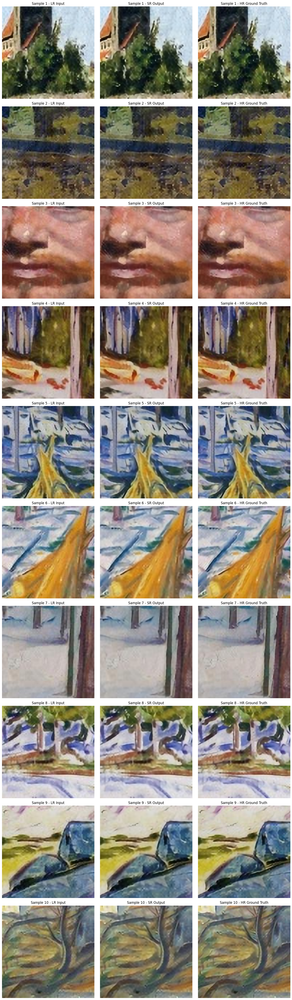

In [18]:
import matplotlib.pyplot as plt


import os
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Define image transform
to_tensor = transforms.ToTensor()

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define and load model
model = SwinIR(embed_dim=96, depths=[6, 6], num_heads=[6, 6], window_size=8)
model.load_state_dict(torch.load('/kaggle/input/paintings/swinir_best (1).pth', map_location=device))
model = model.to(device)
model.eval()
# Number of samples you want to visualize
num_samples = 10  # <-- CHANGED to 10
dataset = DIV2KDataset(
   '/kaggle/input/paintings/512_data',
        '/kaggle/input/paintings/1024data',
    crop_size=256.
)
train_loader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=2)

# Grab first 10 samples directly from the dataset (not from DataLoader batch)
with torch.no_grad():
    lr_list, sr_list, hr_list = [], [], []
    for i in range(num_samples):
        lr, hr = train_loader.dataset[i]  # <-- Access dataset directly
        lr = lr.unsqueeze(0).to(device)   # Add batch dimension
        hr = hr.unsqueeze(0).to(device)
        sr = model(lr)

        # Store results
        lr_list.append(lr.squeeze(0).cpu())
        sr_list.append(sr.squeeze(0).cpu())
        hr_list.append(hr.squeeze(0).cpu())

# Plot
fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))

for i in range(num_samples):
    lr_img = lr_list[i].permute(1,2,0).numpy()
    sr_img = sr_list[i].permute(1,2,0).clamp(0,1).numpy()
    hr_img = hr_list[i].permute(1,2,0).numpy()

    axes[i, 0].imshow(lr_img)
    axes[i, 0].set_title(f"Sample {i+1} - LR Input")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(sr_img)
    axes[i, 1].set_title(f"Sample {i+1} - SR Output")
    axes[i, 1].axis('off')

    axes[i, 2].imshow(hr_img)
    axes[i, 2].set_title(f"Sample {i+1} - HR Ground Truth")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


In [19]:
from torchvision.transforms.functional import to_pil_image
import os

# Directory to save images
save_dir = "/kaggle/working/selected_samples"
os.makedirs(save_dir, exist_ok=True)

# Save samples 4, 5, 6 (index 3, 4, 5)
for i in [3, 4, 5]:
    to_pil_image(lr_list[i]).save(os.path.join(save_dir, f'sample_{i+1}_lr.png'))
    to_pil_image(sr_list[i].clamp(0, 1)).save(os.path.join(save_dir, f'sample_{i+1}_sr.png'))
    to_pil_image(hr_list[i]).save(os.path.join(save_dir, f'sample_{i+1}_hr.png'))

print(f"Saved LR, SR, HR images for samples 4, 5, and 6 to: {save_dir}")


Saved LR, SR, HR images for samples 4, 5, and 6 to: /kaggle/working/selected_samples


Test Results

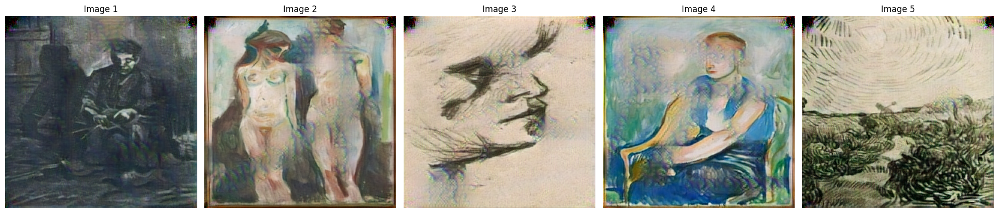

In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Test directory containing inpainted images
test_dir = '/kaggle/input/paintings/inpainted_results'

# Check only first 20 files and pick 5 that end with '_inpainted.png'
all_files = os.listdir(test_dir)[:80]
image_files = [f for f in all_files if f.endswith('_inpainted.png')][:25]

# Plot
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, fname in enumerate(image_files):
    img_path = os.path.join(test_dir, fname)
    img = Image.open(img_path).convert('RGB')

    axes[i].imshow(img)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()


/tmp/ipykernel_31/538387728.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/input/paintings/swinir_best (1).pth', map_location

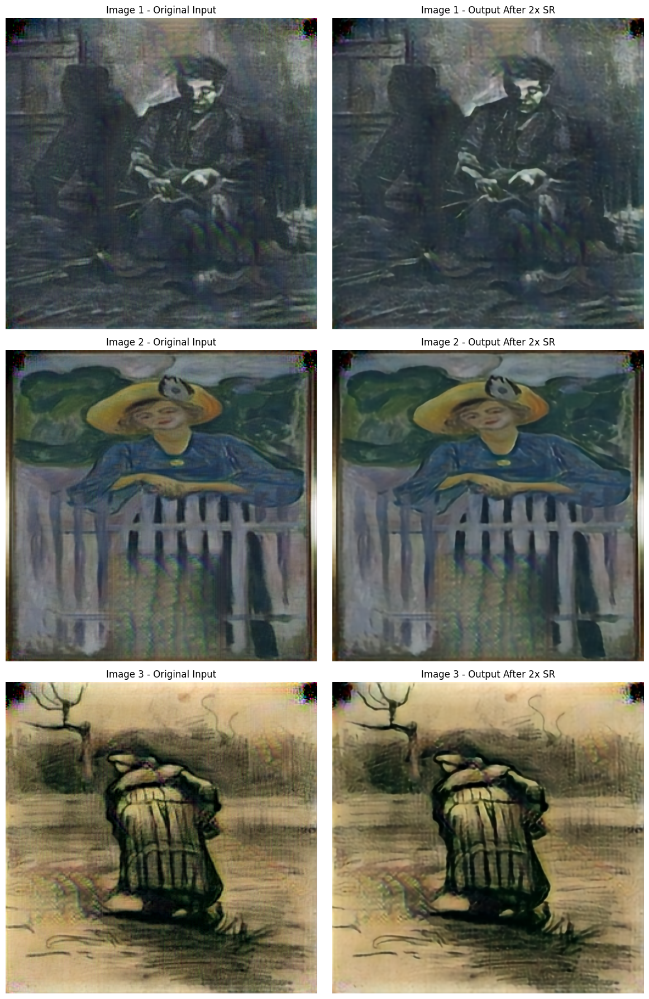

In [23]:
import os
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Define image transform
to_tensor = transforms.ToTensor()

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define and load model
model = SwinIR(embed_dim=96, depths=[6, 6], num_heads=[6, 6], window_size=8)
model.load_state_dict(torch.load('/kaggle/input/paintings/swinir_best (1).pth', map_location=device))
model = model.to(device)
model.eval()

# Get test images (first 10 matching in first 90 files)
test_dir = '/kaggle/input/paintings/inpainted_results'
all_files = os.listdir(test_dir)[:90]
image_files_full = [f for f in all_files if f.endswith('_inpainted.png')][:10]

# Select 1st, 6th, and 10th images (0-based indices: 0, 5, 9)
image_files = [image_files_full[i] for i in [0, 5, 9]]

# Run inference recursively
lr_list = []
final_sr_list = []

with torch.no_grad():
    for fname in image_files:
        img_path = os.path.join(test_dir, fname)
        img = Image.open(img_path).convert('RGB')
        
        input_tensor = to_tensor(img).unsqueeze(0).to(device)
        lr_list.append(input_tensor.squeeze(0).cpu())  # original input
        
        for _ in range(2):  # Apply model 2 times recursively
            input_tensor = model(input_tensor)
            input_tensor = torch.clamp(input_tensor, 0, 1)

        final_sr_list.append(input_tensor.squeeze(0).cpu())  # final output

# Plot results
fig, axes = plt.subplots(3, 2, figsize=(12, 18))
for i in range(3):
    lr_img = lr_list[i].permute(1, 2, 0).numpy()
    sr_img = final_sr_list[i].permute(1, 2, 0).numpy()

    axes[i, 0].imshow(lr_img)
    axes[i, 0].set_title(f"Image {i+1} - Original Input")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(sr_img)
    axes[i, 1].set_title(f"Image {i+1} - Output After 2x SR")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


In [24]:
from torchvision.transforms.functional import to_pil_image

# Define output directory
output_dir = '/kaggle/working/outputs'
os.makedirs(output_dir, exist_ok=True)

# Save both LR and SR images
for i, (lr_tensor, sr_tensor) in enumerate(zip(lr_list, final_sr_list)):
    lr_img = to_pil_image(lr_tensor)
    sr_img = to_pil_image(sr_tensor)

    lr_path = os.path.join(output_dir, f'image_{i+1}_lr.png')
    sr_path = os.path.join(output_dir, f'image_{i+1}_sr.png')

    lr_img.save(lr_path)
    sr_img.save(sr_path)

print(f"Saved all LR and SR images to: {output_dir}")


Saved all LR and SR images to: /kaggle/working/outputs


In [16]:
from torchvision.transforms.functional import to_pil_image

# Save final SR outputs
output_dir = '/kaggle/working/sr_outputs'
os.makedirs(output_dir, exist_ok=True)

for i, sr_img_tensor in enumerate(final_sr_list):
    sr_img = to_pil_image(sr_img_tensor)
    save_path = os.path.join(output_dir, f'sr_image_{i+1}.png')
    sr_img.save(save_path)

print("Saved SR images to:", output_dir)


Saved SR images to: /kaggle/working/sr_outputs


In [20]:
from torchvision.transforms.functional import to_pil_image

# Save original inputs and final SR outputs
output_dir = '/kaggle/working/sr_outputs'
os.makedirs(output_dir, exist_ok=True)

for i, (lr_tensor, sr_tensor) in enumerate(zip(lr_list, final_sr_list)):
    # Convert tensors to PIL Images
    lr_img = to_pil_image(lr_tensor)
    sr_img = to_pil_image(sr_tensor)

    # Save both images
    lr_img.save(os.path.join(output_dir, f'image_{i+1}_lr.png'))
    sr_img.save(os.path.join(output_dir, f'image_{i+1}_sr.png'))

print("Saved both LR and SR images to:", output_dir)


Saved both LR and SR images to: /kaggle/working/sr_outputs


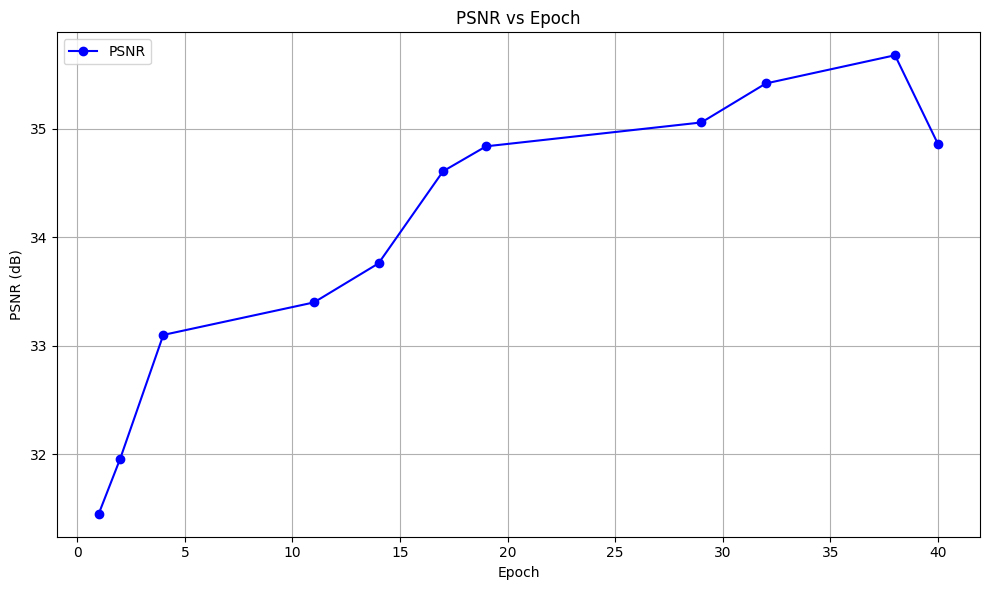

In [21]:
import matplotlib.pyplot as plt

# Sample data from your training logs
epochs = [1, 2, 4, 11, 14, 17, 19, 29, 32, 38, 40]
psnr = [31.45, 31.96, 33.10, 33.40, 33.76, 34.61, 34.84, 35.06, 35.42, 35.68, 34.86]

plt.figure(figsize=(10, 6))
plt.plot(epochs, psnr, marker='o', linestyle='-', color='b', label='PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs Epoch')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig('psnr_plot.png', dpi=300)
plt.show()
